# KITTI Dataset Exploration

In [12]:
"""
parse XML files containing tracklet info for kitti data base (raw data section)
(http://cvlibs.net/datasets/kitti/raw_data.php)

No guarantees that this code is correct, usage is at your own risk!

created by Christian Herdtweck, Max Planck Institute for Biological Cybernetics
  (christian.herdtweck@tuebingen.mpg.de)
updated by Alex Staravoitau

requires numpy!

example usage:
  import parseTrackletXML as xmlParser
  kittiDir = '/path/to/kitti/data'
  drive = '2011_09_26_drive_0001'
  xmlParser.example(kittiDir, drive)
or simply on command line:
  python parseTrackletXML.py
"""

# Version History:
# 20/3/17 Alex Staravoitau: updated for Python 3, cleaned up docstring comments, fixed tabulation; 
# 4/7/12 Christian Herdtweck: seems to work with a few random test xml tracklet files; 
#   converts file contents to ElementTree and then to list of Tracklet objects; 
#   Tracklet objects have str and iter functions
# 5/7/12 ch: added constants for state, occlusion, truncation and added consistency checks
# 30/1/14 ch: create example function from example code

from sys import argv as cmdLineArgs
from xml.etree.ElementTree import ElementTree
import numpy as np
from warnings import warn

STATE_UNSET = 0
STATE_INTERP = 1
STATE_LABELED = 2
stateFromText = {'0':STATE_UNSET, '1':STATE_INTERP, '2':STATE_LABELED}

OCC_UNSET = 255  # -1 as uint8
OCC_VISIBLE = 0
OCC_PARTLY = 1
OCC_FULLY = 2
occFromText = {'-1':OCC_UNSET, '0':OCC_VISIBLE, '1':OCC_PARTLY, '2':OCC_FULLY}

TRUNC_UNSET = 255  # -1 as uint8, but in xml files the value '99' is used!
TRUNC_IN_IMAGE = 0
TRUNC_TRUNCATED = 1
TRUNC_OUT_IMAGE = 2
TRUNC_BEHIND_IMAGE = 3
truncFromText = {'99':TRUNC_UNSET, '0':TRUNC_IN_IMAGE, '1':TRUNC_TRUNCATED, '2':TRUNC_OUT_IMAGE, '3': TRUNC_BEHIND_IMAGE}


class Tracklet(object):
    """ 
    Representation an annotated object track 

    Tracklets are created in function parseXML and can most conveniently used as follows:

    for trackletObj in parseXML(trackletFile):
    for translation, rotation, state, occlusion, truncation, amtOcclusion, amtBorders, absoluteFrameNumber in trackletObj:
      ... your code here ...
    #end: for all frames
    #end: for all tracklets

    absoluteFrameNumber is in range [firstFrame, firstFrame+nFrames[
    amtOcclusion and amtBorders could be None

    You can of course also directly access the fields objType (string), size (len-3 ndarray), firstFrame/nFrames (int), 
    trans/rots (nFrames x 3 float ndarrays), states/truncs (len-nFrames uint8 ndarrays), occs (nFrames x 2 uint8 ndarray),
    and for some tracklets amtOccs (nFrames x 2 float ndarray) and amtBorders (nFrames x 3 float ndarray). The last two
    can be None if the xml file did not include these fields in poses
    """

    objectType = None
    size = None  # len-3 float array: (height, width, length)
    firstFrame = None
    trans = None   # n x 3 float array (x,y,z)
    rots = None    # n x 3 float array (x,y,z)
    states = None  # len-n uint8 array of states
    occs = None    # n x 2 uint8 array  (occlusion, occlusion_kf)
    truncs = None  # len-n uint8 array of truncation
    amtOccs = None    # None or (n x 2) float array  (amt_occlusion, amt_occlusion_kf)
    amtBorders = None    # None (n x 3) float array  (amt_border_l / _r / _kf)
    nFrames = None

    def __init__(self):
        """ 
        Creates Tracklet with no info set 
        """
        self.size = np.nan*np.ones(3, dtype=float)

    def __str__(self):
        """ 
        Returns human-readable string representation of tracklet object

        called implicitly in 
        print trackletObj
        or in 
        text = str(trackletObj)
        """
        return '[Tracklet over {0} frames for {1}]'.format(self.nFrames, self.objectType)

    def __iter__(self):
        """ 
        Returns an iterator that yields tuple of all the available data for each frame 

        called whenever code iterates over a tracklet object, e.g. in 
        for translation, rotation, state, occlusion, truncation, amtOcclusion, amtBorders, absoluteFrameNumber in trackletObj:
          ...do something ...
        or
        trackDataIter = iter(trackletObj)
        """
        if self.amtOccs is None:
            return zip(self.trans, self.rots, self.states, self.occs, self.truncs,
                itertools.repeat(None), itertools.repeat(None), range(self.firstFrame, self.firstFrame+self.nFrames))
        else:
            return zip(self.trans, self.rots, self.states, self.occs, self.truncs,
                self.amtOccs, self.amtBorders, range(self.firstFrame, self.firstFrame+self.nFrames))
#end: class Tracklet


def parseXML(trackletFile):
    """ 
    Parses tracklet xml file and convert results to list of Tracklet objects

    :param trackletFile: name of a tracklet xml file
    :returns: list of Tracklet objects read from xml file
    """

    # convert tracklet XML data to a tree structure
    eTree = ElementTree()
    print('Parsing tracklet file', trackletFile)
    with open(trackletFile) as f:
        eTree.parse(f)

    # now convert output to list of Tracklet objects
    trackletsElem = eTree.find('tracklets')
    tracklets = []
    trackletIdx = 0
    nTracklets = None
    for trackletElem in trackletsElem:
        #print 'track:', trackletElem.tag
        if trackletElem.tag == 'count':
            nTracklets = int(trackletElem.text)
            print('File contains', nTracklets, 'tracklets')
        elif trackletElem.tag == 'item_version':
            pass
        elif trackletElem.tag == 'item':
            #print 'tracklet {0} of {1}'.format(trackletIdx, nTracklets)
            # a tracklet
            newTrack = Tracklet()
            isFinished = False
            hasAmt = False
            frameIdx = None
            for info in trackletElem:
                #print 'trackInfo:', info.tag
                if isFinished:
                    raise ValueError('more info on element after finished!')
                if info.tag == 'objectType':
                    newTrack.objectType = info.text
                elif info.tag == 'h':
                    newTrack.size[0] = float(info.text)
                elif info.tag == 'w':
                    newTrack.size[1] = float(info.text)
                elif info.tag == 'l':
                    newTrack.size[2] = float(info.text)
                elif info.tag == 'first_frame':
                    newTrack.firstFrame = int(info.text)
                elif info.tag == 'poses':
                    # this info is the possibly long list of poses
                    for pose in info:
                        #print 'trackInfoPose:', pose.tag
                        if pose.tag == 'count':     # this should come before the others
                            if newTrack.nFrames is not None:
                                raise ValueError('there are several pose lists for a single track!')
                            elif frameIdx is not None:
                                raise ValueError('?!')
                            newTrack.nFrames = int(pose.text)
                            newTrack.trans = np.nan * np.ones((newTrack.nFrames, 3), dtype=float)
                            newTrack.rots = np.nan * np.ones((newTrack.nFrames, 3), dtype=float)
                            newTrack.states = np.nan * np.ones(newTrack.nFrames, dtype='uint8')
                            newTrack.occs = np.nan * np.ones((newTrack.nFrames, 2), dtype='uint8')
                            newTrack.truncs = np.nan * np.ones(newTrack.nFrames, dtype='uint8')
                            newTrack.amtOccs = np.nan * np.ones((newTrack.nFrames, 2), dtype=float)
                            newTrack.amtBorders = np.nan * np.ones((newTrack.nFrames, 3), dtype=float)
                            frameIdx = 0
                        elif pose.tag == 'item_version':
                            pass
                        elif pose.tag == 'item':
                            # pose in one frame
                            if frameIdx is None:
                                raise ValueError('pose item came before number of poses!')
                            for poseInfo in pose:
                                #print 'trackInfoPoseInfo:', poseInfo.tag
                                if poseInfo.tag == 'tx':
                                    newTrack.trans[frameIdx, 0] = float(poseInfo.text)
                                elif poseInfo.tag == 'ty':
                                    newTrack.trans[frameIdx, 1] = float(poseInfo.text)
                                elif poseInfo.tag == 'tz':
                                    newTrack.trans[frameIdx, 2] = float(poseInfo.text)
                                elif poseInfo.tag == 'rx':
                                    newTrack.rots[frameIdx, 0] = float(poseInfo.text)
                                elif poseInfo.tag == 'ry':
                                    newTrack.rots[frameIdx, 1] = float(poseInfo.text)
                                elif poseInfo.tag == 'rz':
                                    newTrack.rots[frameIdx, 2] = float(poseInfo.text)
                                elif poseInfo.tag == 'state':
                                    newTrack.states[frameIdx] = stateFromText[poseInfo.text]
                                elif poseInfo.tag == 'occlusion':
                                    newTrack.occs[frameIdx, 0] = occFromText[poseInfo.text]
                                elif poseInfo.tag == 'occlusion_kf':
                                    newTrack.occs[frameIdx, 1] = occFromText[poseInfo.text]
                                elif poseInfo.tag == 'truncation':
                                    newTrack.truncs[frameIdx] = truncFromText[poseInfo.text]
                                elif poseInfo.tag == 'amt_occlusion':
                                    newTrack.amtOccs[frameIdx,0] = float(poseInfo.text)
                                    hasAmt = True
                                elif poseInfo.tag == 'amt_occlusion_kf':
                                    newTrack.amtOccs[frameIdx,1] = float(poseInfo.text)
                                    hasAmt = True
                                elif poseInfo.tag == 'amt_border_l':
                                    newTrack.amtBorders[frameIdx,0] = float(poseInfo.text)
                                    hasAmt = True
                                elif poseInfo.tag == 'amt_border_r':
                                    newTrack.amtBorders[frameIdx,1] = float(poseInfo.text)
                                    hasAmt = True
                                elif poseInfo.tag == 'amt_border_kf':
                                    newTrack.amtBorders[frameIdx,2] = float(poseInfo.text)
                                    hasAmt = True
                                else:
                                    raise ValueError('unexpected tag in poses item: {0}!'.format(poseInfo.tag))
                            frameIdx += 1
                        else:
                            raise ValueError('unexpected pose info: {0}!'.format(pose.tag))
                elif info.tag == 'finished':
                    isFinished = True
                else:
                    raise ValueError('unexpected tag in tracklets: {0}!'.format(info.tag))
            #end: for all fields in current tracklet

            # some final consistency checks on new tracklet
            if not isFinished:
                warn('tracklet {0} was not finished!'.format(trackletIdx))
            if newTrack.nFrames is None:
                warn('tracklet {0} contains no information!'.format(trackletIdx))
            elif frameIdx != newTrack.nFrames:
                warn('tracklet {0} is supposed to have {1} frames, but perser found {1}!'.format(trackletIdx, newTrack.nFrames, frameIdx))
            if np.abs(newTrack.rots[:,:2]).sum() > 1e-16:
                warn('track contains rotation other than yaw!')

            # if amtOccs / amtBorders are not set, set them to None
            if not hasAmt:
                newTrack.amtOccs = None
                newTrack.amtBorders = None

            # add new tracklet to list
            tracklets.append(newTrack)
            trackletIdx += 1

        else:
            raise ValueError('unexpected tracklet info')
    #end: for tracklet list items

    print('Loaded', trackletIdx, 'tracklets.')

    # final consistency check
    if trackletIdx != nTracklets:
        warn('according to xml information the file has {0} tracklets, but parser found {1}!'.format(nTracklets, trackletIdx))

    return tracklets
#end: function parseXML


In [19]:
import numpy as np
import pykitti

# Change this to the directory where you store KITTI data
basedir = '/home/dayoff/Documents/unb/tg2/data'

def load_dataset(date, drive, calibrated=False, frame_range=None):
    """
    Loads the dataset with `date` and `drive`.
    
    Parameters
    ----------
    date        : Dataset creation date.
    drive       : Dataset drive.
    calibrated  : Flag indicating if we need to parse calibration data. Defaults to `False`.
    frame_range : Range of frames. Defaults to `None`.

    Returns
    -------
    Loaded dataset of type `raw`.
    """
    dataset = pykitti.raw(basedir, date, drive)

    # Load the data
    if calibrated:
        dataset.load_calib()  # Calibration data are accessible as named tuples

    np.set_printoptions(precision=4, suppress=True)
    print('\nDrive: ' + str(dataset.drive))
    print('\nFrame range: ' + str(dataset.frames))

    if calibrated:
        print('\nIMU-to-Velodyne transformation:\n' + str(dataset.calib.T_velo_imu))
        print('\nGray stereo pair baseline [m]: ' + str(dataset.calib.b_gray))
        print('\nRGB stereo pair baseline [m]: ' + str(dataset.calib.b_rgb))

    return dataset

In [25]:
def load_tracklets_for_frames(n_frames, xml_path):
    """
    Loads dataset labels also referred to as tracklets, saving them individually for each frame.

    Parameters
    ----------
    n_frames    : Number of frames in the dataset.
    xml_path    : Path to the tracklets XML.

    Returns
    -------
    Tuple of dictionaries with integer keys corresponding to absolute frame numbers and arrays as values. First array
    contains coordinates of bounding box vertices for each object in the frame, and the second array contains objects
    types as strings.
    """
    tracklets = parseXML(xml_path)

    frame_tracklets = {}
    frame_tracklets_types = {}
    for i in range(n_frames):
        frame_tracklets[i] = []
        frame_tracklets_types[i] = []

    # loop over tracklets
    for i, tracklet in enumerate(tracklets):
        # this part is inspired by kitti object development kit matlab code: computeBox3D
        h, w, l = tracklet.size
        # in velodyne coordinates around zero point and without orientation yet
        trackletBox = np.array([
            [-l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2],
            [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2],
            [0.0, 0.0, 0.0, 0.0, h, h, h, h]
        ])
        # loop over all data in tracklet
        for translation, rotation, state, occlusion, truncation, amtOcclusion, amtBorders, absoluteFrameNumber in tracklet:
            # determine if object is in the image; otherwise continue
            if truncation not in (TRUNC_IN_IMAGE, TRUNC_TRUNCATED):
                continue
            # re-create 3D bounding box in velodyne coordinate system
            yaw = rotation[2]  # other rotations are supposedly 0
            assert np.abs(rotation[:2]).sum() == 0, 'object rotations other than yaw given!'
            rotMat = np.array([
                [np.cos(yaw), -np.sin(yaw), 0.0],
                [np.sin(yaw), np.cos(yaw), 0.0],
                [0.0, 0.0, 1.0]
            ])
            cornerPosInVelo = np.dot(rotMat, trackletBox) + np.tile(translation, (8, 1)).T
            frame_tracklets[absoluteFrameNumber] = frame_tracklets[absoluteFrameNumber] + [cornerPosInVelo]
            frame_tracklets_types[absoluteFrameNumber] = frame_tracklets_types[absoluteFrameNumber] + [
                tracklet.objectType]

    return (frame_tracklets, frame_tracklets_types)

In [26]:
date = '2011_09_26'
drive = '0001'
dataset = load_dataset(date, drive)
tracklet_rects, tracklet_types = load_tracklets_for_frames(len(list(dataset.velo)), '{}/{}/{}_drive_{}_sync/tracklet_labels.xml'.format(basedir,date, date, drive))


Drive: 2011_09_26_drive_0001_sync

Frame range: None
Parsing tracklet file /home/dayoff/Documents/unb/tg2/data/2011_09_26/2011_09_26_drive_0001_sync/tracklet_labels.xml
File contains 15 tracklets
Loaded 15 tracklets.


In [27]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

colors = {
    'Car': 'b',
    'Tram': 'r',
    'Cyclist': 'g',
    'Van': 'c',
    'Truck': 'm',
    'Pedestrian': 'y',
    'Sitter': 'k'
}
axes_limits = [
    [-20, 80], # X axis range
    [-20, 20], # Y axis range
    [-3, 10]   # Z axis range
]
axes_str = ['X', 'Y', 'Z']

def draw_box(pyplot_axis, vertices, axes=[0, 1, 2], color='black'):
    """
    Draws a bounding 3D box in a pyplot axis.
    
    Parameters
    ----------
    pyplot_axis : Pyplot axis to draw in.
    vertices    : Array 8 box vertices containing x, y, z coordinates.
    axes        : Axes to use. Defaults to `[0, 1, 2]`, e.g. x, y and z axes.
    color       : Drawing color. Defaults to `black`.
    """
    vertices = vertices[axes, :]
    connections = [
        [0, 1], [1, 2], [2, 3], [3, 0],  # Lower plane parallel to Z=0 plane
        [4, 5], [5, 6], [6, 7], [7, 4],  # Upper plane parallel to Z=0 plane
        [0, 4], [1, 5], [2, 6], [3, 7]  # Connections between upper and lower planes
    ]
    for connection in connections:
        pyplot_axis.plot(*vertices[:, connection], c=color, lw=0.5)

def display_frame_statistics(dataset, tracklet_rects, tracklet_types, frame, points=0.2):
    """
    Displays statistics for a single frame. Draws camera data, 3D plot of the lidar point cloud data and point cloud
    projections to various planes.
    
    Parameters
    ----------
    dataset         : `raw` dataset.
    tracklet_rects  : Dictionary with tracklet bounding boxes coordinates.
    tracklet_types  : Dictionary with tracklet types.
    frame           : Absolute number of the frame.
    points          : Fraction of lidar points to use. Defaults to `0.2`, e.g. 20%.
    """
    dataset_gray = list(dataset.gray)
    dataset_rgb = list(dataset.rgb)
    dataset_velo = list(dataset.velo)
    
    print('Frame timestamp: ' + str(dataset.timestamps[frame]))
    # Draw camera data
    f, ax = plt.subplots(2, 2, figsize=(15, 5))
    ax[0, 0].imshow(dataset_gray[frame][0], cmap='gray')
    ax[0, 0].set_title('Left Gray Image (cam0)')
    ax[0, 1].imshow(dataset_gray[frame][1], cmap='gray')
    ax[0, 1].set_title('Right Gray Image (cam1)')
    ax[1, 0].imshow(dataset_rgb[frame][0])
    ax[1, 0].set_title('Left RGB Image (cam2)')
    ax[1, 1].imshow(dataset_rgb[frame][1])
    ax[1, 1].set_title('Right RGB Image (cam3)')
    plt.show()

    points_step = int(1. / points)
    point_size = 0.01 * (1. / points)
    velo_range = range(0, dataset_velo[frame].shape[0], points_step)
    velo_frame = dataset_velo[frame][velo_range, :]      
    def draw_point_cloud(ax, title, axes=[0, 1, 2], xlim3d=None, ylim3d=None, zlim3d=None):
        """
        Convenient method for drawing various point cloud projections as a part of frame statistics.
        """
        ax.scatter(*np.transpose(velo_frame[:, axes]), s=point_size, c=velo_frame[:, 3], cmap='gray')
        ax.set_title(title)
        ax.set_xlabel('{} axis'.format(axes_str[axes[0]]))
        ax.set_ylabel('{} axis'.format(axes_str[axes[1]]))
        if len(axes) > 2:
            ax.set_xlim3d(*axes_limits[axes[0]])
            ax.set_ylim3d(*axes_limits[axes[1]])
            ax.set_zlim3d(*axes_limits[axes[2]])
            ax.set_zlabel('{} axis'.format(axes_str[axes[2]]))
        else:
            ax.set_xlim(*axes_limits[axes[0]])
            ax.set_ylim(*axes_limits[axes[1]])
        # User specified limits
        if xlim3d!=None:
            ax.set_xlim3d(xlim3d)
        if ylim3d!=None:
            ax.set_ylim3d(ylim3d)
        if zlim3d!=None:
            ax.set_zlim3d(zlim3d)
            
        for t_rects, t_type in zip(tracklet_rects[frame], tracklet_types[frame]):
            draw_box(ax, t_rects, axes=axes, color=colors[t_type])
            
    # Draw point cloud data as 3D plot
    f2 = plt.figure(figsize=(15, 8))
    ax2 = f2.add_subplot(111, projection='3d')                    
    draw_point_cloud(ax2, 'Velodyne scan', xlim3d=(-10,30))
    plt.show()
    
    # Draw point cloud data as plane projections
    f, ax3 = plt.subplots(3, 1, figsize=(15, 25))
    draw_point_cloud(
        ax3[0], 
        'Velodyne scan, XZ projection (Y = 0), the car is moving in direction left to right', 
        axes=[0, 2] # X and Z axes
    )
    draw_point_cloud(
        ax3[1], 
        'Velodyne scan, XY projection (Z = 0), the car is moving in direction left to right', 
        axes=[0, 1] # X and Y axes
    )
    draw_point_cloud(
        ax3[2], 
        'Velodyne scan, YZ projection (X = 0), the car is moving towards the graph plane', 
        axes=[1, 2] # Y and Z axes
    )
    plt.show()

Frame timestamp: 2011-09-26 13:02:27.004432


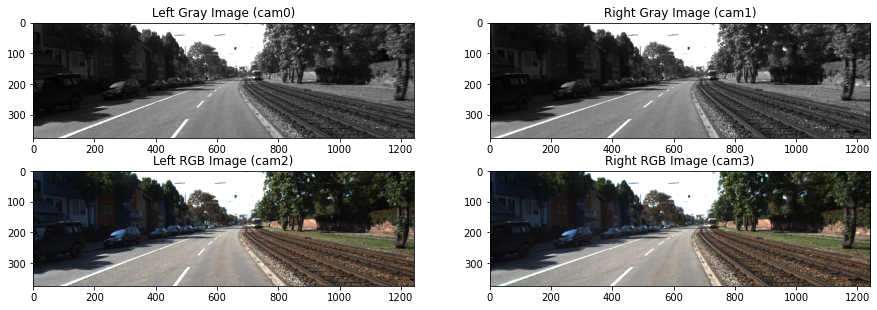

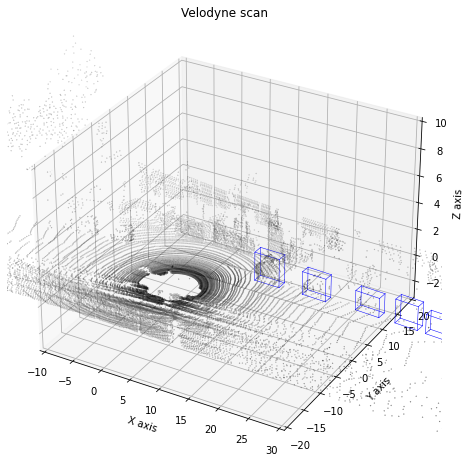

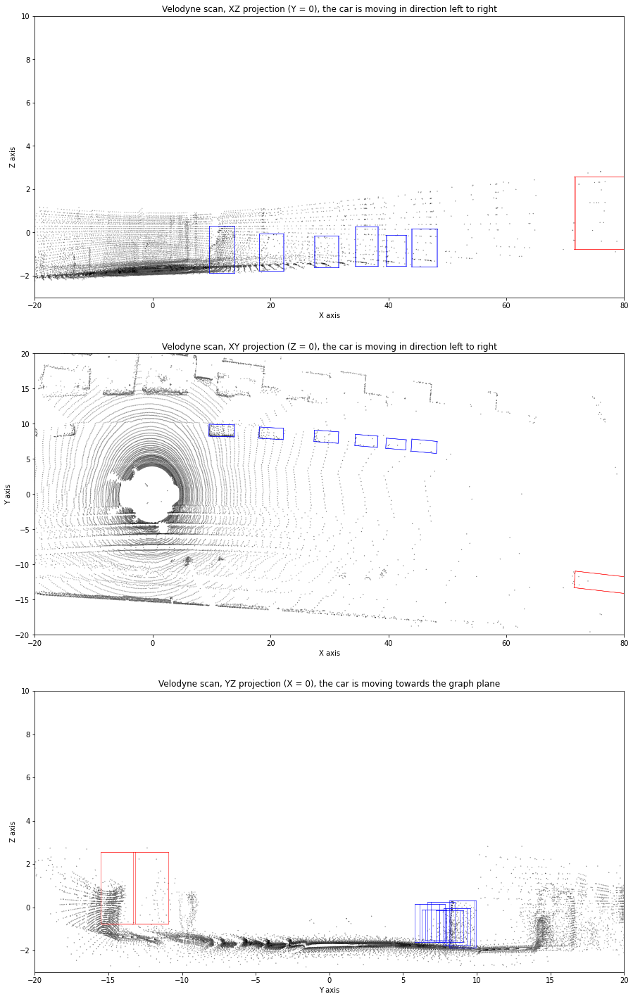

In [28]:
frame = 10

display_frame_statistics(dataset, tracklet_rects, tracklet_types, frame)

In [ ]:
from source.utilities import print_progress
from moviepy.editor import ImageSequenceClip

def draw_3d_plot(frame, dataset, tracklet_rects, tracklet_types, points=0.2):
    """
    Saves a single frame for an animation: a 3D plot of the lidar data without ticks and all frame trackelts.
    Parameters
    ----------
    frame           : Absolute number of the frame.
    dataset         : `raw` dataset.
    tracklet_rects  : Dictionary with tracklet bounding boxes coordinates.
    tracklet_types  : Dictionary with tracklet types.
    points          : Fraction of lidar points to use. Defaults to `0.2`, e.g. 20%.

    Returns
    -------
    Saved frame filename.
    """
    dataset_velo = list(dataset.velo)
    
    f = plt.figure(figsize=(12, 8))
    axis = f.add_subplot(111, projection='3d', xticks=[], yticks=[], zticks=[])

    points_step = int(1. / points)
    point_size = 0.01 * (1. / points)
    velo_range = range(0, dataset_velo[frame].shape[0], points_step)
    velo_frame = dataset_velo[frame][velo_range, :]
    axis.scatter(*np.transpose(velo_frame[:, [0, 1, 2]]), s=point_size, c=velo_frame[:, 3], cmap='gray')
    axis.set_xlim3d(*axes_limits[0])
    axis.set_ylim3d(*axes_limits[1])
    axis.set_zlim3d(*axes_limits[2])
    for t_rects, t_type in zip(tracklet_rects[frame], tracklet_types[frame]):
        draw_box(axis, t_rects, axes=[0, 1, 2], color=colors[t_type])
    filename = 'video/frame_{0:0>4}.png'.format(frame)
    plt.savefig(filename)
    plt.close(f)
    return filename

frames = []
n_frames = len(list(dataset.velo))

print('Preparing animation frames...')
for i in range(n_frames):
    print_progress(i, n_frames - 1)
    filename = draw_3d_plot(i, dataset, tracklet_rects, tracklet_types)
    frames += [filename]
print('...Animation frames ready.')

clip = ImageSequenceClip(frames, fps=5)
% time
clip.write_gif('pcl_data.gif', fps=5)